# Combine datasets into a single spatially unified dataset 

In [1]:
## Import libraries
# system
import os
import time
import sys
from collections import deque

# data manipulation
import json
import yaml
import numpy as np
import geopandas as gpd
import pandas as pd
import rasterio as rio
from rasterio.enums import Resampling
import rioxarray as rxr
import xarray as xr
import dask
import utm
from pyproj import CRS

# dask friendliness for large rasters
dask.config.set({"array.slicing.split_large_chunks": True})

# visualization
import seaborn as sns
import matplotlib.pyplot as plt

###### setup config variables #######
repo_name = 'masterthesis_genai_spatialplan'
if not repo_name in os.getcwd():
    os.chdir(repo_name)

p=os.popen('git rev-parse --show-toplevel')
repo_dir = p.read().strip()
p.close()

# Import helper functions
sys.path.append(f"{repo_dir}/code/helpers")
from get_region_filenames import get_region_filenames

with open(f"{repo_dir}/config.yml", 'r') as stream:
    config = yaml.safe_load(stream)

regions = config['regions'] 

big_data_storage_path = config.get("big_data_storage_path", "/work/zt75vipu-master/data")
region_filenames_json = get_region_filenames(config_path=f"{repo_dir}/config.yml")
print("Region filenames JSON loaded successfully: ", region_filenames_json)

#seaborn cmap
rocket=sns.color_palette("rocket", as_cmap=True)
mako=sns.color_palette("mako", as_cmap=True)

Getting region filenames from config...
Regions to process: ['Dresden', 'Leipzig', 'Hamburg', 'Stuttgart']
Region filenames JSON loaded successfully:  {'Dresden': {'landsat_zarr_name': 'D:/master_thesis/data/landsat/dresden/landsat_temperature_ge25_cc10_2019_2024.zarr', 'osm_zarr_name': 'D:/master_thesis/data/osm/dresden/osm_rasterized.zarr', 'planet_zarr_name': 'D:/master_thesis/data/planet_scope/dresden/planet_config_ge25_cc10_2019_2024.zarr', 'processed_zarr_name': 'D:/master_thesis/data/processed/dresden/input_config_ge25_cc10_2019_2024.zarr'}, 'Leipzig': {'landsat_zarr_name': 'D:/master_thesis/data/landsat/leipzig/landsat_temperature_ge25_cc10_2019_2024.zarr', 'osm_zarr_name': 'D:/master_thesis/data/osm/leipzig/osm_rasterized.zarr', 'planet_zarr_name': 'D:/master_thesis/data/planet_scope/leipzig/planet_config_ge25_cc10_2019_2024.zarr', 'processed_zarr_name': 'D:/master_thesis/data/processed/leipzig/input_config_ge25_cc10_2019_2024.zarr'}, 'Hamburg': {'landsat_zarr_name': 'D:/maste

In [2]:
# Disclaimer: Code here is heavily adapted from personal previous work 
# on the project https://ipe.arch.rwth-aachen.de/cms/IPE/Forschung/Schwerpunkte/Nachhaltiges-Bauen/~fhrxl/SmartQuart/

# function to define rural areas from OSM data
def define_rural_areas(region: str, crs="EPSG:32633", max_distance=30):
    osm_path = f"{big_data_storage_path}/osm/{region.lower()}"
    data_filename = f"{osm_path}/osm_gdf.parquet"
    filename = f"{big_data_storage_path}/osm/{region.lower()}/rural_areas.parquet"
    
    if not os.path.exists(data_filename):
        raise FileNotFoundError(f"OSM data file not found at {data_filename}. Please ensure OSM data is available before combining datasets.")

    osm_gdf=gpd.read_parquet(data_filename)[["id","geometry","natural", "water", "boundary", "landuse", "building", "highway", "waterway", "leisure"]]
    
    if not os.path.exists(filename):
        print("Defining rural areas...")
        
        # get the geometries
        geom_gdf=osm_gdf[osm_gdf["landuse"].isin(["farmland", "forest", "plant_nursery"])]
        geom_gdf=geom_gdf[~geom_gdf["geometry"].isna()]
        
        # reproject to crs
        geom_gdf=geom_gdf.to_crs(crs)
        
        # set geoms 
        geom_gdf.set_index("id",inplace=True)
        geom=geom_gdf.geometry
        
        shapes=[]
        agricultural_and_forest = geom_gdf.copy()
        crs=agricultural_and_forest.crs
        agricultural_and_forest["featureType"]=0
        
        # display(agricultural_and_forest)

        # Create a mapping from id to unique numeric identifiers
        # id_mapping = {id: idx for idx, id in enumerate(agricultural_and_forest['id'].unique())}
        id_mapping = {id: idx for idx, id in enumerate(agricultural_and_forest.index.unique())}

        # Replace id with numeric identifiers
        agricultural_and_forest['id_numeric'] = agricultural_and_forest.index.map(id_mapping)
        geom.index = geom.index.map(id_mapping)

        # Drop unnecessary columns
        agricultural_and_forest.drop(columns=['geometry'], inplace=True)

        sindex=geom.sindex # spatial index for nearest neighbour search

        # function to find nearest feature
        def findNearest (feature, max_distance=max_distance, sindex=sindex):
            nearest=sindex.nearest(feature.geometry, max_distance=max_distance, return_all=True, return_distance=True, exclusive=True)
            return nearest

        # function to find shapes connected to each other
        def findShape (feature):
            if feature["featureType"]==1: # already visited
                return feature
            
            original_shape = feature.copy()
            featurelist = [] # Store the connected shapes
            featureIDs = {}  # Store the indices of the shapes
            feature = geom[geom.index == feature["id_numeric"]] # Get the geometry
            current = findNearest(feature, max_distance=max_distance)
            
            for i in current[0][1]: # for only one nearest length is 1
                featurelist.append(geom.iloc[i:i+1])
                featureIDs[geom.iloc[i:i+1].index[0]] = len(featurelist) - 1  # Store the index of the building
            startpoints = featurelist.copy()
            featurelist.append(feature) # Add the geometry to the list
            featureIDs[feature.index[0]] = len(featurelist) - 1  # Store the index of the geometry


            # queue to store shapes 
            startpointsDict = {}
            queue = deque([(feature, feature) for feature in startpoints])

            # Breadth-first search to find all connected shapes
            while queue:
                startpoint, x = queue.popleft()
                current = findNearest(geom[geom.index == x.index[0]], max_distance=max_distance)

                # Filter out visited shapes
                current = [x for x in current[0][1] if geom.iloc[x:x+1].index[0] not in featureIDs]

                for c in current:
                    x = geom.iloc[c:c+1]
                    featurelist.append(x)
                    featureIDs[x.index[0]] = len(featurelist) - 1

                    # Add the geometry to the queue
                    queue.append((startpoint, x))
                    startpointsDict[startpoint.index[0]] = x.index[0]

            featurelistIDs = [feature.index[0] for feature in featurelist]
            union = gpd.GeoDataFrame(geometry=[pd.concat(featurelist).union_all()])
            union.crs = crs
            union["numfeatures"]=len(featurelist)
            union["area"]=union.geometry.area
            shapes.append(union)
            
            # let all shapes in the list have the same building type to skip them if featureType is already set
            agricultural_and_forest.loc[agricultural_and_forest['id_numeric'].isin(featurelistIDs), "featureType"] = 1
            original_shape["featureType"]=1
            
            return original_shape
        
        print("Finding connected rural shapes...")
        agricultural_and_forest = agricultural_and_forest.apply(findShape, axis=1)
        
        # concatenate all shapes
        print("Concatenating shapes...")
        newshapes = pd.concat(shapes, ignore_index=True)
        newshapes["id"]=newshapes.index
        newshapes_gdf = gpd.GeoDataFrame(newshapes, geometry='geometry', crs=crs)
        
        # save to file
        print(f"Saving rural areas to {filename}...")
        newshapes_gdf.to_parquet(filename)
        print("Rural areas saved successfully.")
        
        return newshapes_gdf

    else:
        print(f"Rural areas file already exists at {filename}. Loading existing file.")
        return gpd.read_parquet(filename)

In [ ]:
# helper: reproject/resample every variable in a Dataset
def reproject_ds(ds: xr.Dataset, template_da: xr.DataArray, resampling: Resampling) -> xr.Dataset:
    out_vars = {}
    for name, da in ds.data_vars.items():
        # carry nodata forward
        if da.rio.nodata is None and getattr(da, "_FillValue", None) is not None:
            da = da.rio.write_nodata(da._FillValue, encoded=True)
        out_vars[name] = da.rio.reproject_match(template_da, resampling=resampling)
    out = xr.Dataset(out_vars)
    # copy non-spatial coords
    for c in ds.coords:
        if c not in ("x", "y"):
            out = out.assign_coords({c: ds[c]})
    out.attrs = ds.attrs
    return out

# combine function
def combine_datasets(region=regions[0]):
    """
    Combine Planet, OSM, and Landsat datasets into a single xarray Dataset.
    Aligns datasets spatially and temporally.
    Saves the combined dataset as a Zarr file.
    
    Args:
        region (str): Region name to process. Defaults to the first region in the config.
    
    Returns:
        xr.Dataset: Combined dataset with Planet, OSM, and Landsat data.
    """
    
    # setup folders
    processed_region_folder = f"{big_data_storage_path}/processed/{region.lower()}"
    os.makedirs(processed_region_folder, exist_ok=True)
    filenames = region_filenames_json[region]
    processed_zarr_name = filenames['processed_zarr_name']
    processed_zarr_name_clipped = processed_zarr_name.replace(".zarr", "_clipped.zarr")

    if os.path.exists(processed_zarr_name) and os.path.exists(processed_zarr_name_clipped):
        print(f"Processed Zarr file already exists at {processed_zarr_name}. Skipping processing.")
        return xr.open_zarr(processed_zarr_name, consolidated=True)
    
    # define the bbox
    ghsl_df_new = gpd.read_parquet(f"{repo_dir}/data/processed/ghsl_regions.parquet")
    bbox_gdf = gpd.GeoDataFrame(geometry=ghsl_df_new[ghsl_df_new["region_name"]==region].bbox, crs="EPSG:4326")

    # reproject gdfs to utm zone
    easting, northing, zone_number, zone_letter = utm.from_latlon(bbox_gdf.geometry.centroid.y.values[0], bbox_gdf.geometry.centroid.x.values[0])
    is_south = zone_letter < 'N'  # True for southern hemisphere
    utm_crs = CRS.from_dict({'proj': 'utm', 'zone': int(zone_number), 'south': is_south})
    print(f"UTM CRS: {utm_crs.to_authority()} with zone {zone_number}{zone_letter}")
    bbox_gdf = bbox_gdf.to_crs(utm_crs)

    # define rural areas
    rural_areas_gdf_path = f"{big_data_storage_path}/osm/{region.lower()}/rural_areas.parquet"
    if os.path.exists(rural_areas_gdf_path):
        print(f"Loading rural areas from {rural_areas_gdf_path}...")
        forest_and_agricultural = gpd.read_parquet(rural_areas_gdf_path)
        forest_and_agricultural = forest_and_agricultural.to_crs(utm_crs)
    else:
        forest_and_agricultural = define_rural_areas(region=region, crs=utm_crs, max_distance=50)
        print(f"Saving rural areas for {region}.")
        forest_and_agricultural.to_parquet(rural_areas_gdf_path)

    # define the clip polygon
    clip_gdf = gpd.GeoDataFrame(geometry=[forest_and_agricultural[forest_and_agricultural.area > 1000000].buffer(25).union_all()], crs=forest_and_agricultural.crs)

    drop_vars = ['qa_pixel',
    'stac_id',
    'view_sun_azimuth',
    'surface_temp_b10',
    'view_off_nadir',
    'view_sun_elevation']

    planet_xs = xr.open_zarr(filenames['planet_zarr_name'], consolidated=True)
    planet_xs = planet_xs.set_coords("spatial_ref")
    
    osm_xs = xr.open_zarr(filenames['osm_zarr_name'], consolidated=True)
    landsat_xs = xr.open_zarr(filenames['landsat_zarr_name'], consolidated=True, drop_variables=drop_vars)

    # rename surface_temp_b10 to land_surface_temp
    lst_name = "landsat_surface_temp_b10_masked"
    landsat_xs = landsat_xs.rename({"surface_temp_b10_masked": lst_name})

    # convert time to miunute precision
    landsat_xs['time'] = landsat_xs['time'].astype('datetime64[m]')
    planet_xs['time'] = planet_xs['time'].astype('datetime64[m]')

    # find nearest landsat time for each planet time and modify planet time to match
    planet_times = planet_xs['time'].values
    landsat_times = landsat_xs['time'].values
    nearest_landsat_times = np.array([landsat_times[np.abs(landsat_times - pt).argmin()] for pt in planet_times])
    planet_xs = planet_xs.assign_coords(time=nearest_landsat_times) 

    #add spatial_ref coordinate to landsat
    print("CRS of OSM dataset:", osm_xs.rio.crs)
    landsat_xs = landsat_xs.rio.write_crs(osm_xs.rio.crs, inplace=True)
    landsat_xs = landsat_xs.rio.write_coordinate_system(inplace=True)

    # rechunk to common chunk size
    common_chunks = {'x': planet_xs.chunks['x'][0], 'y': planet_xs.chunks['y'][0]}
    landsat_xs = landsat_xs.chunk(common_chunks)
    osm_xs = osm_xs.chunk(common_chunks)
    planet_xs = planet_xs.chunk(common_chunks)
    
    # templates for reprojection
    template = (
        planet_xs.isel(time=0)
        .rio.write_crs(planet_xs.rio.crs, inplace=False)
    )

    # ensure spatial dims are x/y for all three
    datasets = {"planet_xs": planet_xs, "landsat_xs": landsat_xs, "osm_xs": osm_xs}
    for key, ds in datasets.items():
        if {"x", "y"} - set(ds.dims):
            ds.rio.set_spatial_dims(x_dim="x", y_dim="y", inplace=True)
        datasets[key] = ds  # keep reference
    planet_xs, landsat_xs, osm_xs = datasets["planet_xs"], datasets["landsat_xs"], datasets["osm_xs"]


    ## resample/reproject datasets to common grid
    print("Reprojecting and resampling datasets to common grid...")
    print(f"Target CRS: {template.rio.crs}")
    #resample/reproject osm
    osm_on_planet = reproject_ds(osm_xs, template, Resampling.nearest)

    # resample/reproject landsat lst
    if landsat_xs[lst_name].rio.nodata is None:
        landsat_xs[lst_name] = landsat_xs[lst_name].rio.write_nodata(-9999, encoded=True)

    landsat_lst_on_planet = landsat_xs[lst_name].rio.reproject_match(
        template, resampling=Resampling.bilinear
    )

    # convert no data values back to NaN
    landsat_lst_on_planet = landsat_lst_on_planet.where(landsat_lst_on_planet != -9999, np.nan)

    # rechunk to align with planet_xs
    target_chunks = {"y": planet_xs.chunks["y"][0], "x": planet_xs.chunks["x"][0]}
    osm_on_planet = osm_on_planet.chunk(target_chunks)
    if "time" in landsat_lst_on_planet.dims:
        target_chunks = {"time": 1, **target_chunks}
    landsat_lst_on_planet = landsat_lst_on_planet.chunk(target_chunks)

    # merge all three datasets
    print("Merging datasets...")
    merged_xs = xr.merge(
        [planet_xs,osm_on_planet, landsat_lst_on_planet.to_dataset(name=lst_name)],
        compat="override",
        join="outer",
        fill_value=np.nan
    )
    
    
    # set crs
    merged_xs = merged_xs.rio.write_crs(planet_xs.rio.crs, inplace=True)
    
    # reproject clip geom
    clip_gdf = clip_gdf.to_crs(merged_xs.rio.crs)
    clip_geom = bbox_gdf.overlay(clip_gdf, how='difference').geometry.union_all()

    # clip dataset to clip box
    print("Clipping dataset to area of interest...")
    merged_xs_clipped = merged_xs.rio.clip([clip_geom], forest_and_agricultural.crs, drop=True, invert=False)
    
    # remove chunk encoding to prevent errors
    for var in merged_xs.data_vars:
        if 'chunks' in merged_xs[var].encoding:
            del merged_xs[var].encoding['chunks']
    
    # display(merged_xs)
    
    # save to zarr
    print("Saving processed Zarr file...")
    merged_xs.to_zarr(
        processed_zarr_name,
        mode="w",
        consolidated=True,
        compute=True,
    )
    print(f"Processed Zarr file saved at {processed_zarr_name}.")
    
    
    # per-dimension chunk-size mapping
    clipped_chunk_sizes = {}
    for dim in merged_xs_clipped.dims:
        if dim in merged_xs.chunks and merged_xs.chunks[dim]:
            clipped_chunk_sizes[dim] = merged_xs.chunks[dim][0]  # use size, not full tuple
        else:
            # default sizes
            clipped_chunk_sizes[dim] = 1 if dim == "time" else merged_xs_clipped.sizes[dim]

    if "time" in merged_xs_clipped.dims:
        clipped_chunk_sizes["time"] = 1

    merged_xs_clipped = merged_xs_clipped.chunk(clipped_chunk_sizes)

    
    for var in merged_xs_clipped.data_vars:
        if 'chunks' in merged_xs_clipped[var].encoding:
            del merged_xs_clipped[var].encoding['chunks']

    merged_xs_clipped.to_zarr(
        processed_zarr_name_clipped,
        mode="w",
        consolidated=True,
        compute=True,
    )
    print(f"Clipped processed Zarr file saved at {processed_zarr_name_clipped}.")
    
    
    return [merged_xs, merged_xs_clipped]


# merged_xs = combine_datasets(region=regions[3])

for region in regions:
    print(f"Processing region: {region}")
    merged_xs = combine_datasets(region=region)


Processing region: Dresden
Processed Zarr file already exists at D:/master_thesis/data/processed/dresden/input_config_ge25_cc10_2019_2024.zarr. Skipping processing.
Processing region: Leipzig


C:\Users\janne\AppData\Local\Temp\ipykernel_20176\800995610.py:47: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  easting, northing, zone_number, zone_letter = utm.from_latlon(bbox_gdf.geometry.centroid.y.values[0], bbox_gdf.geometry.centroid.x.values[0])


UTM CRS: ('EPSG', '32633') with zone 33U
Loading rural areas from D:/master_thesis/data/osm/leipzig/rural_areas.parquet...


c:\Users\janne\anaconda3\envs\genaiSpatialplan\Lib\site-packages\zarr\codecs\vlen_utf8.py:43: UserWarning: The codec `vlen-utf8` is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  return cls(**configuration_parsed)


CRS of OSM dataset: EPSG:4326
Reprojecting and resampling datasets to common grid...
Target CRS: EPSG:32633
Merging datasets...
Clipping dataset to area of interest...
Saving processed Zarr file...


c:\Users\janne\anaconda3\envs\genaiSpatialplan\Lib\site-packages\zarr\core\dtype\npy\string.py:248: UnstableSpecificationWarning: The data type (FixedLengthUTF32(length=5, endianness='little')) does not have a Zarr V3 specification. That means that the representation of arrays saved with this data type may change without warning in a future version of Zarr Python. Arrays stored with this data type may be unreadable by other Zarr libraries. Use this data type at your own risk! Check https://github.com/zarr-developers/zarr-extensions/tree/main/data-types for the status of data type specifications for Zarr V3.
  v3_unstable_dtype_warning(self)
c:\Users\janne\anaconda3\envs\genaiSpatialplan\Lib\site-packages\zarr\api\asynchronous.py:229: UserWarning: Consolidated metadata is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  warnings.warn(


Processed Zarr file saved at D:/master_thesis/data/processed/leipzig/input_config_ge25_cc10_2019_2024.zarr.


c:\Users\janne\anaconda3\envs\genaiSpatialplan\Lib\site-packages\zarr\core\dtype\npy\string.py:248: UnstableSpecificationWarning: The data type (FixedLengthUTF32(length=5, endianness='little')) does not have a Zarr V3 specification. That means that the representation of arrays saved with this data type may change without warning in a future version of Zarr Python. Arrays stored with this data type may be unreadable by other Zarr libraries. Use this data type at your own risk! Check https://github.com/zarr-developers/zarr-extensions/tree/main/data-types for the status of data type specifications for Zarr V3.
  v3_unstable_dtype_warning(self)
c:\Users\janne\anaconda3\envs\genaiSpatialplan\Lib\site-packages\zarr\api\asynchronous.py:229: UserWarning: Consolidated metadata is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  warnings.warn(


Clipped processed Zarr file saved at D:/master_thesis/data/processed/leipzig/input_config_ge25_cc10_2019_2024_clipped.zarr.
Processing region: Hamburg


C:\Users\janne\AppData\Local\Temp\ipykernel_20176\800995610.py:47: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  easting, northing, zone_number, zone_letter = utm.from_latlon(bbox_gdf.geometry.centroid.y.values[0], bbox_gdf.geometry.centroid.x.values[0])


UTM CRS: ('EPSG', '32632') with zone 32U
Defining rural areas...
Finding connected rural shapes...


In [8]:
processed_zarr_name = get_region_filenames(config_path=f"{repo_dir}/config.yml")[regions[3]]['processed_zarr_name']
merged_xs = xr.open_zarr(processed_zarr_name, consolidated=True)

Getting region filenames from config...
Regions to process: ['Dresden', 'Leipzig', 'Hamburg', 'Stuttgart']


In [14]:
processed_zarr_name_clipped = processed_zarr_name.replace(".zarr", "_clipped.zarr")
merged_xs_clipped = xr.open_zarr(processed_zarr_name_clipped, consolidated=True)

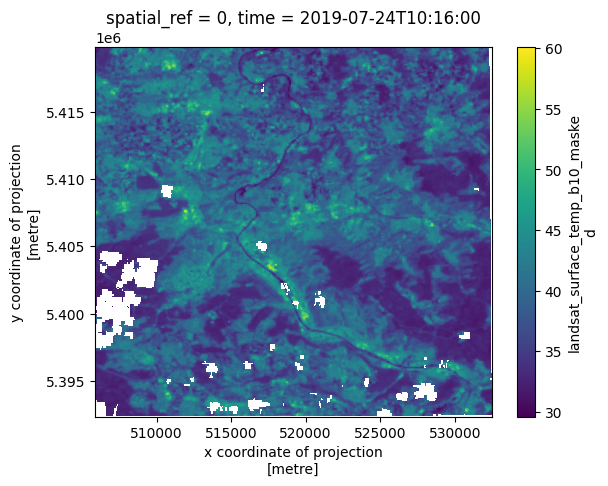

In [9]:
merged_xs.isel(time=0).landsat_surface_temp_b10_masked.plot()

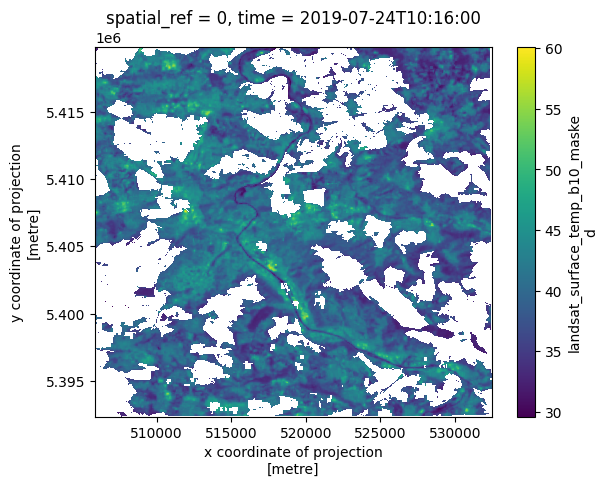

In [15]:
merged_xs_clipped.isel(time=0).landsat_surface_temp_b10_masked.plot()

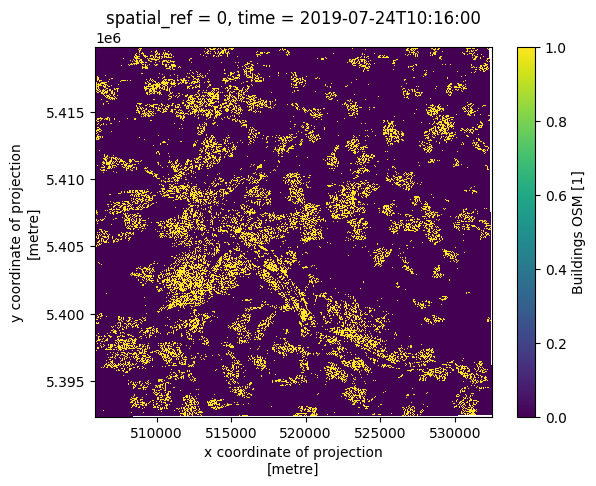

In [13]:
merged_xs.isel(time=0).buildings.plot()

Number of valid PlanetScope dates: 2


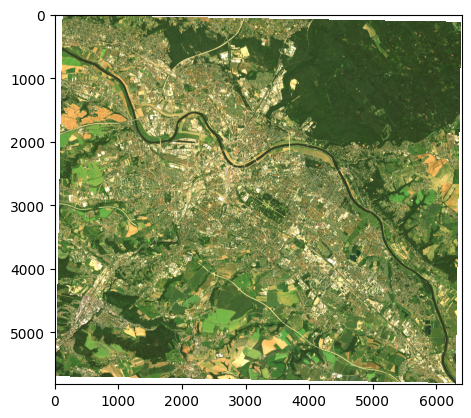

In [ ]:
# get all dates where not null count of planet bands >0
valid_planet_dates = (merged_xs['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs['time'].where(valid_planet_dates, drop=True).values
print(f"Number of valid PlanetScope dates: {len(valid_planet_dates)}")

reflectance = merged_xs.planetscope_sr_4band.sel(time=valid_planet_dates[0])

rgb = np.stack([
    reflectance.isel(channel=2),
    reflectance.isel(channel=1),
    reflectance.isel(channel=0)
], axis=-1)

rgb = np.clip(rgb / np.nanpercentile(rgb, 98), 0, 1)
plt.imshow(rgb)
plt.show()
plt.close()

### Plot side by side

In [ ]:
from functools import reduce
import random
import json

def plot_img_array(img_array, ncol=3):
    nrow = len(img_array) // ncol

    f, plots = plt.subplots(nrow, ncol, sharex='all', sharey='all', figsize=(ncol * 4, nrow * 4))

    for i in range(len(img_array)):
        plots[i // ncol, i % ncol]
        plots[i // ncol, i % ncol].imshow(img_array[i])

def plot_side_by_side(img_arrays):
    flatten_list = reduce(lambda x,y: x+y, zip(*img_arrays))

    plot_img_array(np.array(flatten_list), ncol=len(img_arrays))

In [ ]:
def mask_to_colorimg(mask, class_dict=None, custom_colors=None, random_seed=42):
    """
    Convert a class mask to a colored image.
    
    Args:
        mask: 2D numpy array with class indices
        class_dict: Dictionary mapping class indices to class names (optional)
        custom_colors: Optional dict mapping class values to RGB colors
        random_seed: Seed for random color generation to ensure consistency
    
    Returns:
        RGB image as numpy array with shape (height, width, 3)
    """
    # Set random seed for reproducible colors
    random.seed(random_seed)
    
    # Generate distinct colors 
    if custom_colors is None:
        distinct_colors = [
            [0,0,0],      # Black
            [255, 0, 0],    # Red
            [0, 255, 0],    # Green
            [0, 0, 255],    # Blue
            [255, 255, 0],  # Yellow
            [255, 0, 255],  # Magenta
            [0, 255, 255],  # Cyan
            [128, 0, 0],    # Maroon
            [0, 128, 0],    # Dark Green
            [0, 0, 128],    # Navy
            [128, 128, 0],  # Olive
            [128, 0, 128],  # Purple
            [0, 128, 128],  # Teal
            [192, 192, 192],# Silver
            [128, 128, 128],# Gray
            [255, 165, 0],  # Orange
        ]
        
        # Map each class to a color
        color_map = {}
        if class_dict is not None:
            # map classes to colors
            for i, class_label in enumerate(class_dict.values()):
                if i < len(distinct_colors):
                    color_map[class_label] = distinct_colors[i]
                else:
                    # Fall back to random colors if more classes than distinct colors
                    color_map[class_label] = [random.randint(0, 255) for _ in range(3)]
        else:
            # use unique values from the mask
            unique_values = np.unique(mask)
            for i, val in enumerate(unique_values):
                if i < len(distinct_colors):
                    color_map[val] = distinct_colors[i]
                else:
                    color_map[val] = [random.randint(0, 255) for _ in range(3)]
    else:
        # Use custom color mapping if provided
        color_map = custom_colors
    
    # Default color for undefined classes
    default_color = [0, 0, 0]  # Black
    
    # Convert the mask to a color image
    flat_mask = mask.flatten()
    colorimg = np.array([color_map.get(val, default_color) for val in flat_mask])
    
    return colorimg.reshape(mask.shape + (3,))

In [ ]:
# get valid planet dates
valid_planet_dates = (merged_xs['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs['time'].where(valid_planet_dates, drop=True).values

# Load the rgb bands from PlanetScope
planet_data = merged_xs.planetscope_sr_4band.sel(time=valid_planet_dates[0])
blue_band = planet_data.sel(channel='blue')
green_band = planet_data.sel(channel='green')
red_band = planet_data.sel(channel='red')
nir_band = planet_data.sel(channel='nir')

# Stack these into an RGB image for input
rgb_image = np.stack([red_band, green_band, blue_band], axis=-1) 

# Percentile-based contrast stretch
p_low, p_high = 2, 98
rgb_min = np.nanpercentile(rgb_image, p_low)
rgb_max = np.nanpercentile(rgb_image, p_high)
rgb_image = np.clip((rgb_image - rgb_min) / (rgb_max - rgb_min), 0, 1)


# Load target masks for landuse, shapes, and streets
ndvi_mask = merged_xs.ndvi.sel(time=valid_planet_dates[0]).values
landuse_mask = merged_xs.landuse.values
shapes_mask = merged_xs.shapes.values
shapes_service_mask = merged_xs.shapes_service.values
shapes_height_mask = merged_xs.shapes_heights.values
streets_mask = merged_xs.streets.values
streets_surface_mask = merged_xs.streets_surface.values
streets_service_mask = merged_xs.streets_service.values
water_mask = merged_xs.water.values
# lst_mask = merged_xs.landsat_surface_temp_b10_masked.drop_sel(time=merged_xs.planetscope_sr_4band.time[1].values).sel(time=pd.to_datetime(merged_xs.planetscope_sr_4band.time[1].values), method="nearest").values
lst_mask = merged_xs.landsat_surface_temp_b10_masked.sel(time=valid_planet_dates[0]).values

In [ ]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
# Convert masks to RGB
ndvi_mask_rgb = mask_to_colorimg(ndvi_mask, custom_colors={0: [0, 0, 0], 1: [0, 255, 0]})
landuse_mask_rgb = mask_to_colorimg(landuse_mask, json.loads(merged_xs.landuse.attrs["landuse_mapping"]))
shapes_mask_rgb = mask_to_colorimg(shapes_mask)
shapes_services_mask_rgb = mask_to_colorimg(shapes_service_mask, json.loads(merged_xs.shapes_service.attrs["shapes_service_mapping"]))
shapes_height_mask_rgb = mask_to_colorimg(shapes_height_mask)
streets_mask_rgb = mask_to_colorimg(streets_mask)
streets_surface_mask_rgb = mask_to_colorimg(streets_surface_mask, json.loads(merged_xs.streets_surface.attrs["streets_surface_mapping"]))
streets_service_mask_rgb = mask_to_colorimg(streets_service_mask, json.loads(merged_xs.streets_service.attrs["streets_service_mapping"]))
water_mask_rgb = mask_to_colorimg(water_mask, json.loads(merged_xs.water.attrs["water_mapping"]))

In [ ]:
def plot_side_by_side(images, cmap_secondary=None):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 5))
    for i, img in enumerate(images):
        if cmap_secondary is not None and i == 1:
            axes[i].imshow(img, cmap=cmap_secondary)
        else:
            axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()

plot_side_by_side([rgb_image, ndvi_mask], cmap_secondary='RdYlGn')
plot_side_by_side([rgb_image, landuse_mask_rgb])
plot_side_by_side([rgb_image, shapes_mask_rgb])
plot_side_by_side([rgb_image, shapes_services_mask_rgb])
plot_side_by_side([rgb_image, shapes_height_mask_rgb])
plot_side_by_side([rgb_image, streets_mask_rgb])
plot_side_by_side([rgb_image, streets_surface_mask_rgb])
plot_side_by_side([rgb_image, streets_service_mask_rgb])
plot_side_by_side([rgb_image, water_mask_rgb])
plot_side_by_side([rgb_image, lst_mask], cmap_secondary='rocket')

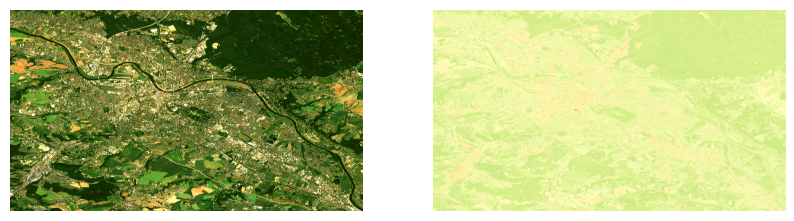

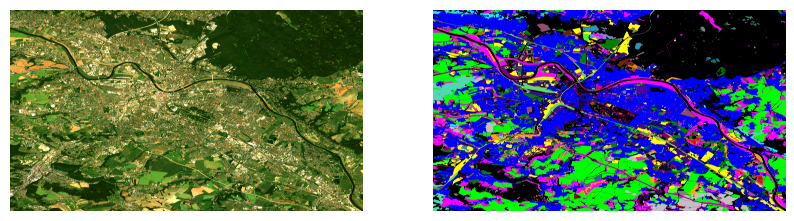

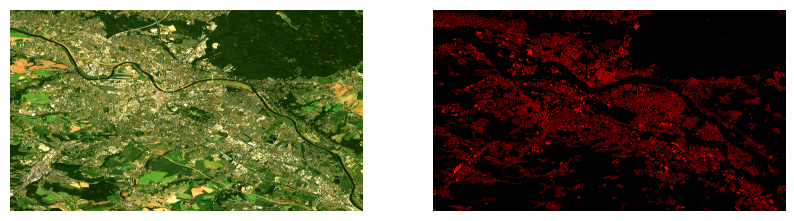

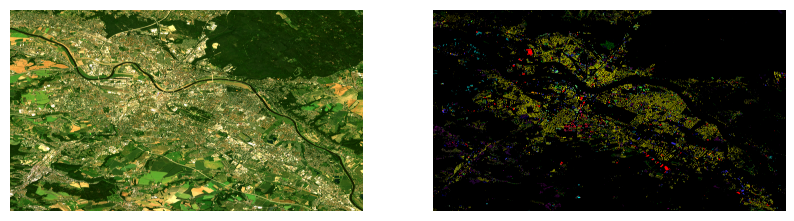

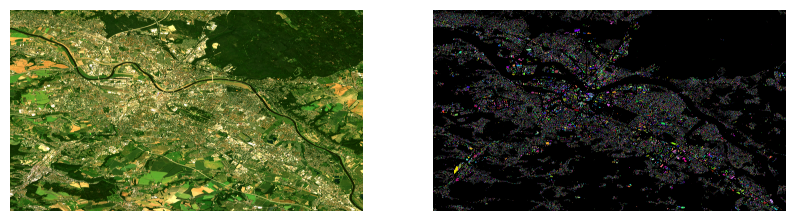

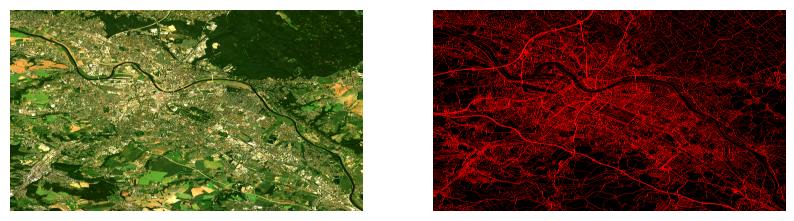

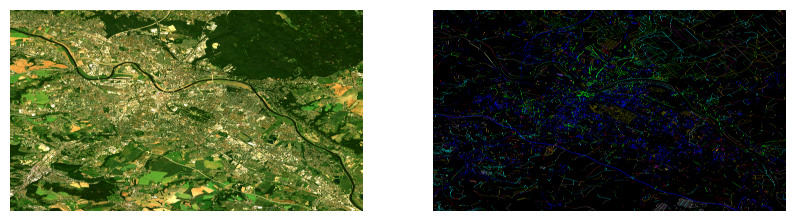

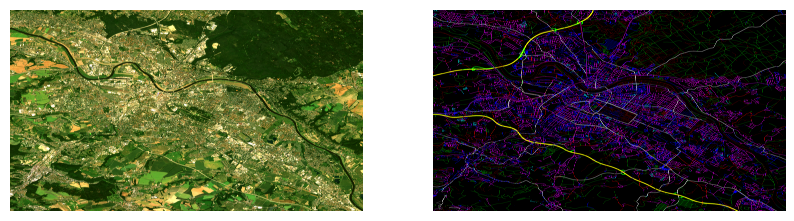

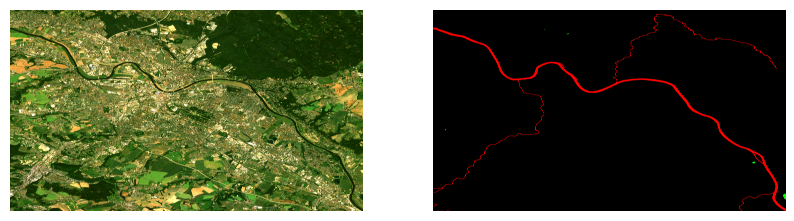

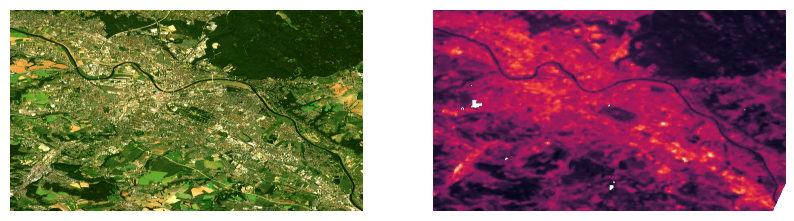

In [ ]:
def plot_side_by_side(images, cmap_secondary=None):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 5))
    for i, img in enumerate(images):
        if cmap_secondary is not None and i == 1:
            axes[i].imshow(img, cmap=cmap_secondary)
        else:
            axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()

plot_side_by_side([rgb_image, ndvi_mask], cmap_secondary='RdYlGn')
plot_side_by_side([rgb_image, landuse_mask_rgb])
plot_side_by_side([rgb_image, shapes_mask_rgb])
plot_side_by_side([rgb_image, shapes_services_mask_rgb])
plot_side_by_side([rgb_image, shapes_height_mask_rgb])
plot_side_by_side([rgb_image, streets_mask_rgb])
plot_side_by_side([rgb_image, streets_surface_mask_rgb])
plot_side_by_side([rgb_image, streets_service_mask_rgb])
plot_side_by_side([rgb_image, water_mask_rgb])
plot_side_by_side([rgb_image, lst_mask], cmap_secondary='rocket')

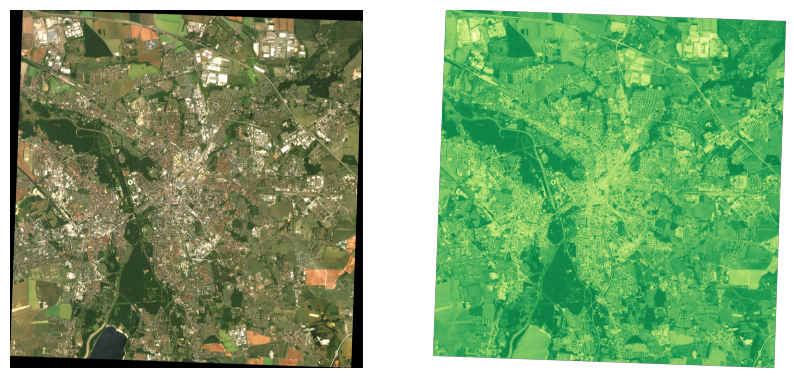

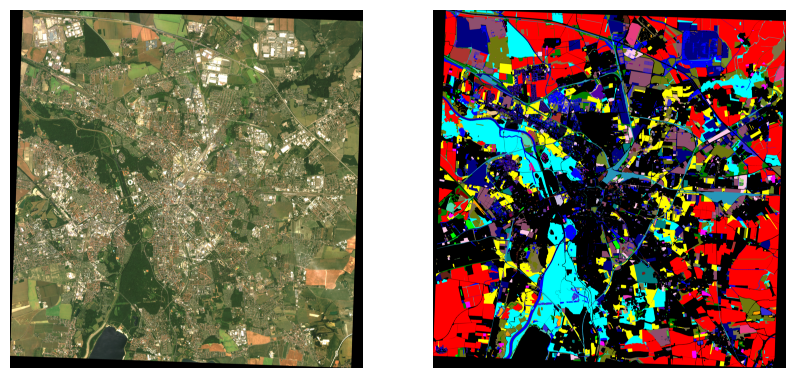

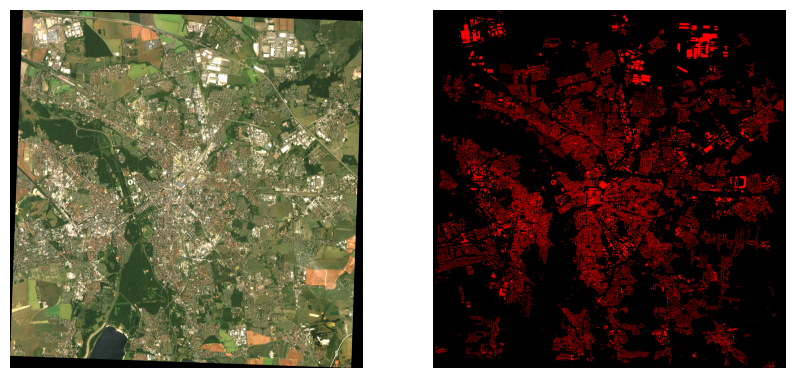

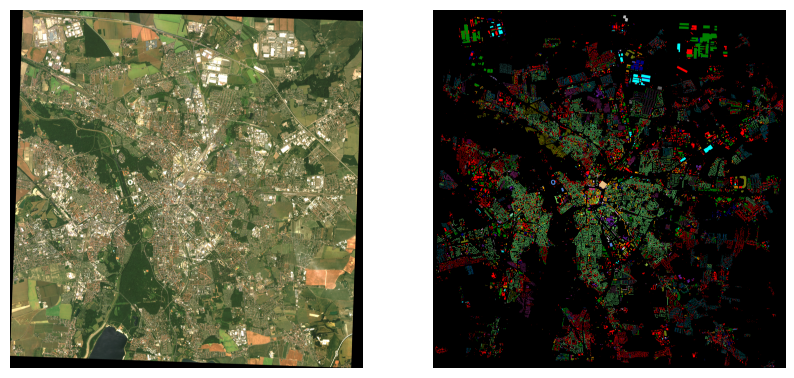

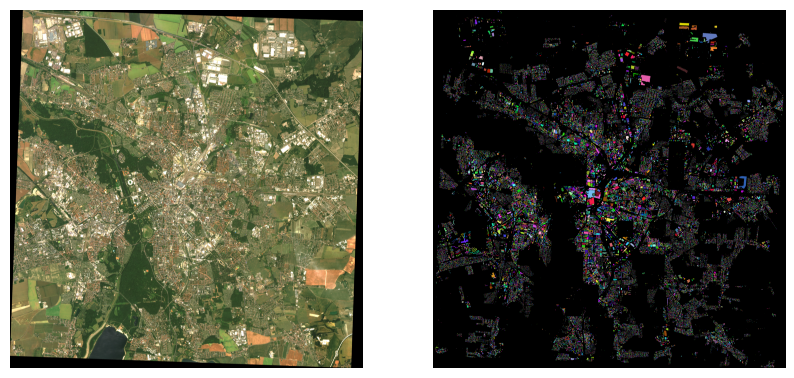

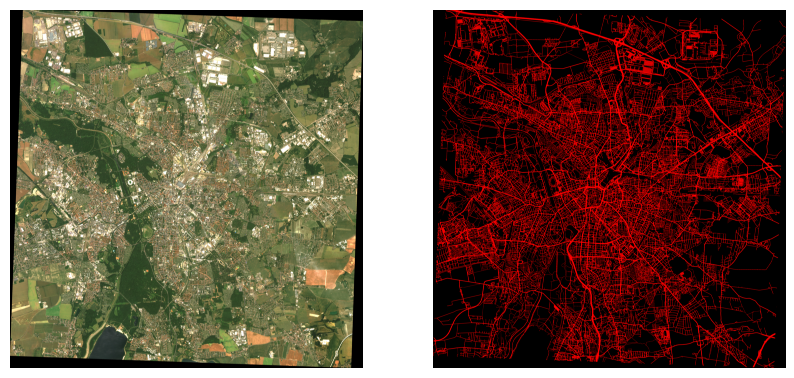

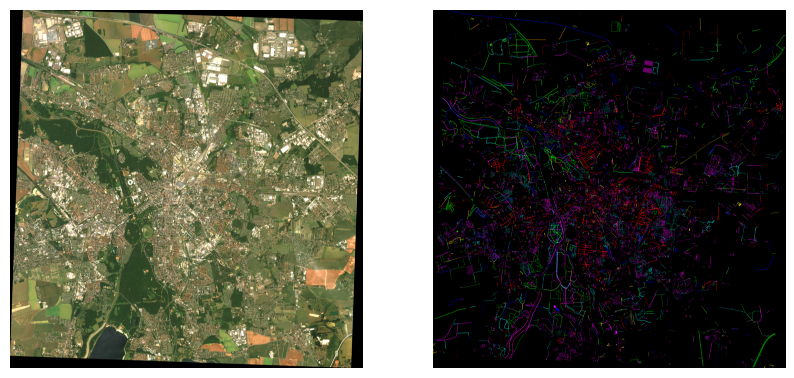

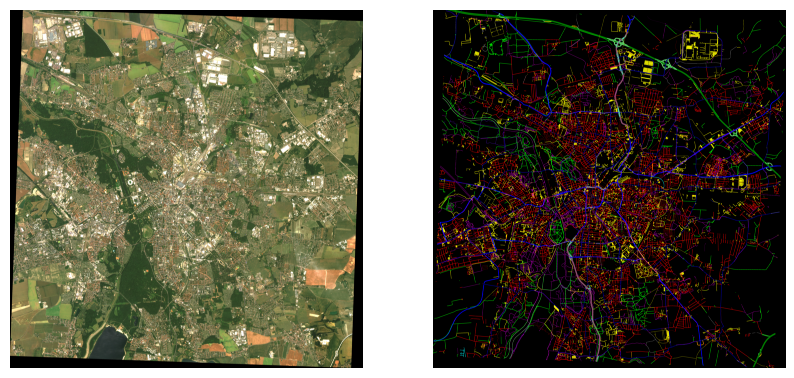

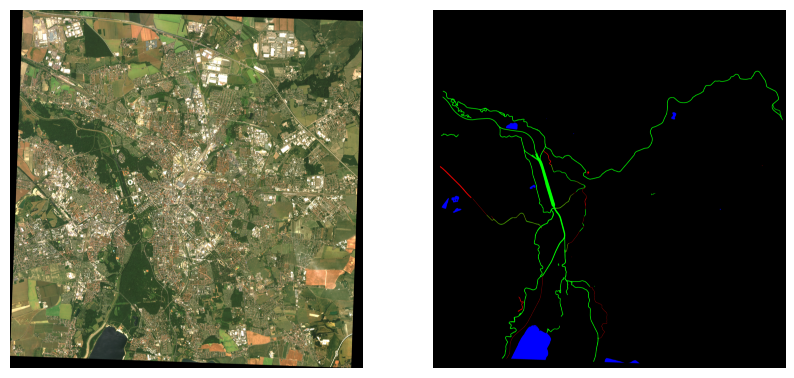

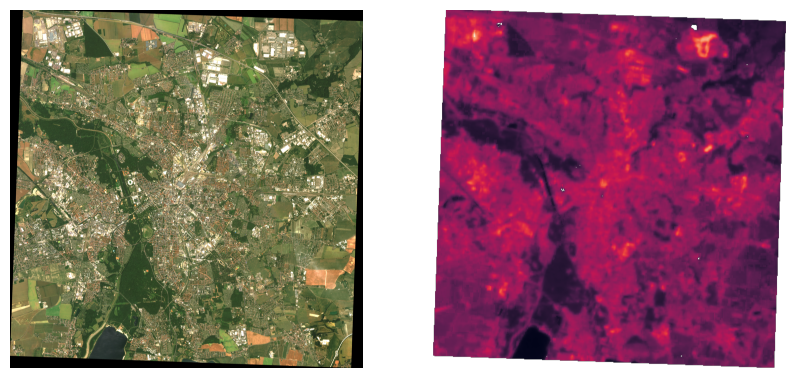

In [ ]:
def plot_side_by_side(images, cmap_secondary=None):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 5))
    for i, img in enumerate(images):
        if cmap_secondary is not None and i == 1:
            axes[i].imshow(img, cmap=cmap_secondary)
        else:
            axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()

plot_side_by_side([rgb_image, ndvi_mask], cmap_secondary='RdYlGn')
plot_side_by_side([rgb_image, landuse_mask_rgb])
plot_side_by_side([rgb_image, shapes_mask_rgb])
plot_side_by_side([rgb_image, shapes_services_mask_rgb])
plot_side_by_side([rgb_image, shapes_height_mask_rgb])
plot_side_by_side([rgb_image, streets_mask_rgb])
plot_side_by_side([rgb_image, streets_surface_mask_rgb])
plot_side_by_side([rgb_image, streets_service_mask_rgb])
plot_side_by_side([rgb_image, water_mask_rgb])
plot_side_by_side([rgb_image, lst_mask], cmap_secondary='rocket')

In [22]:
map = bbox_gdf.explore(color="blue")
clip_gdf.explore(color="red", m=map)